In [1]:
import sys
print(sys.executable)


c:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\venv\Scripts\python.exe


## 📦 Importing Libraries

We begin by importing the libraries required for data exploration and image analysis.

- `os` — for working with directories and file paths
- `numpy` — for numerical operations
- `pandas` — for data manipulation
- `matplotlib` — for visualization
- `PIL.Image` — for loading and inspecting images
- `random` — for selecting random images during visualization
- `collections.Counter` — for counting image dimensions and modes

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import sklearn
import seaborn as sns
from sklearn.metrics import confusion_matrix,classification_report

## 📁 Dataset Structure

The training images are stored in class-specific directories.

Each directory represents one of the six scene categories:

- 🏢 Buildings
- 🌲 Forest
- 🧊 Glacier
- 🏔️ Mountain
- 🌊 Sea
- 🚶 Street

We first define the path to the training dataset and inspect the available classes.

## 📦 Dataset

The project uses the Intel Image Classification dataset.

The training data contains **14,034 images** belonging to six scene categories. Most images are 150 × 150 pixels and all training images use RGB color format.

The dataset will be explored and cleaned before being used for model training.

In [2]:
train_path=r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_train"

In [3]:
classes=os.listdir(train_path)

classes

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

## 📊 Class Distribution

Before training a model, it is important to understand how many images are available for each class.

A highly imbalanced dataset can cause a model to favor classes with more training examples.

We therefore count the number of training images belonging to each scene category.

In [5]:
class_counts={}

for class_name in classes:
    class_path=os.path.join(train_path,class_name)
    class_counts[class_name]=len(os.listdir(class_path))

class_counts

{'buildings': 2191,
 'forest': 2271,
 'glacier': 2404,
 'mountain': 2512,
 'sea': 2274,
 'street': 2382}

### 📌 Observation

The six scene classes contain approximately 2,200–2,500 training images each.

The classes are therefore **reasonably balanced**, and there is no severe class-imbalance problem in the training dataset.

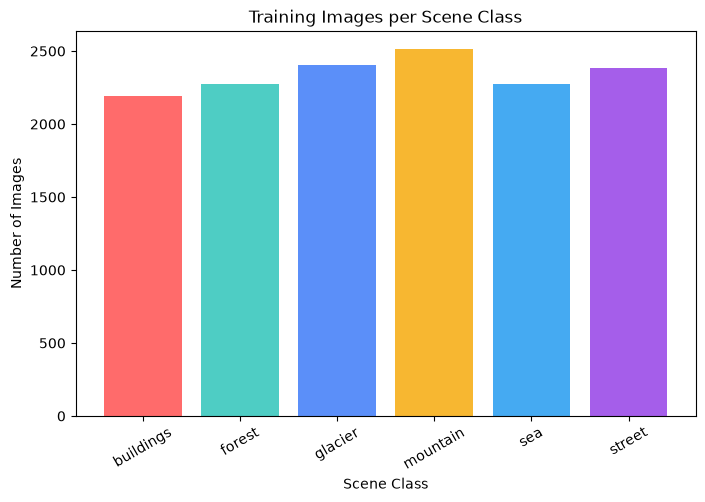

In [6]:
plt.figure(figsize=(8, 5))

colors = [
    "#FF6B6B",  # buildings
    "#4ECDC4",  # forest
    "#5B8FF9",  # glacier
    "#F7B731",  # mountain
    "#45AAF2",  # sea
    "#A55EEA"   # street
]

plt.bar(
    class_counts.keys(),
    class_counts.values(),
    color=colors
)

plt.xlabel("Scene Class")
plt.ylabel("Number of Images")
plt.title("Training Images per Scene Class")

plt.xticks(rotation=30)
plt.show()

### 📈 Class Distribution Visualization

The bar chart confirms that the number of images is relatively similar across all six classes.

The `mountain` class contains the most images, while `buildings` contains the fewest. However, the difference is small enough that special techniques such as aggressive oversampling or class weighting are not immediately necessary.

## 🖼️ Visualizing Sample Images

Numerical statistics alone cannot tell us how visually distinct the scene categories are.

We therefore visualize randomly selected images from each class.

This allows us to inspect:

- Typical visual characteristics of each class
- Differences between scene categories
- Possible overlap between classes
- Image quality and diversity

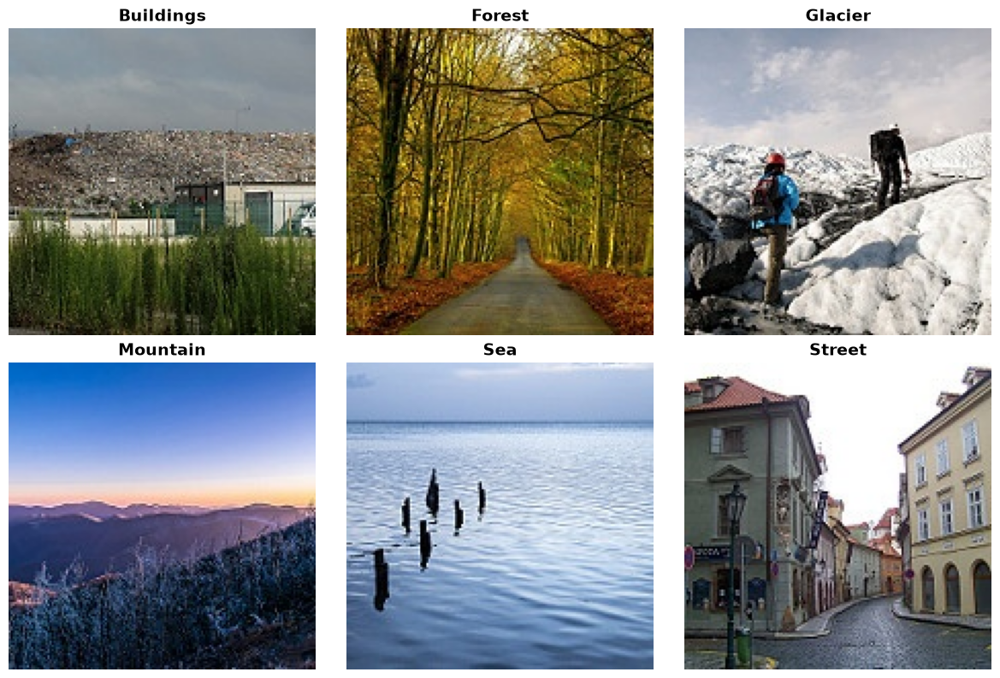

In [7]:
import random
plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    class_path = os.path.join(train_path, class_name)
    image_name = random.choice(os.listdir(class_path))
    image_path = os.path.join(class_path, image_name)

    image = Image.open(image_path)

    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(class_name.capitalize(), fontsize=14, fontweight="bold")
    plt.axis("off")

plt.tight_layout()
plt.show()

### 🔍 Initial Visual Observations

The sample images show that several classes have distinctive visual characteristics.

Buildings, forests, sea, and street scenes often contain recognizable structures or textures that may help a model distinguish them.

However, glacier and mountain scenes show greater visual similarity. Both can contain snow, rocky terrain, similar color distributions, and mountain-like structures.

This suggests that **glacier vs. mountain may be a challenging classification boundary** for the model.

## 📐 Image Dimensions and Color Mode

CNN models require inputs with a consistent shape.

We therefore inspect the dimensions and color mode of the training images.

The expected image format is:

**150 × 150 × 3**

where:

- `150` = image height
- `150` = image width
- `3` = RGB color channels

In [8]:
sample_path = os.path.join(
    train_path,
    classes[0],
    os.listdir(os.path.join(train_path, classes[0]))[0]
)

image = Image.open(sample_path)

print("Image size:", image.size)
print("Image mode:", image.mode)

Image size: (150, 150)
Image mode: RGB


### 📌 Initial Finding

The sampled image has dimensions of `150 × 150` pixels and uses the `RGB` color mode.

However, we need to verify whether this format is consistent across the entire training dataset.

## 🔎 Checking Image Dimensions Across the Dataset

We now inspect every training image to determine whether all images have the same dimensions and color mode.

This helps us identify images that may require special preprocessing before being passed to a CNN.

In [9]:
from collections import Counter

sizes=[]
modes=[]

for class_name in classes:
    class_path=os.path.join(train_path,class_name)

    for image_name in os.listdir(class_path):
        image_path=os.path.join(class_path,image_name)

        with Image.open(image_path) as image:
            sizes.append(image.size)
            modes.append(image.mode)
print("Image sizes:",Counter(sizes))
print("Image modes:",Counter(modes))
      



Image sizes: Counter({(150, 150): 13986, (150, 113): 7, (150, 135): 3, (150, 111): 3, (150, 108): 2, (150, 136): 2, (150, 143): 2, (150, 146): 2, (150, 134): 2, (150, 142): 2, (150, 123): 2, (150, 144): 2, (150, 124): 1, (150, 133): 1, (150, 115): 1, (150, 110): 1, (150, 105): 1, (150, 120): 1, (150, 149): 1, (150, 119): 1, (150, 102): 1, (150, 76): 1, (150, 97): 1, (150, 103): 1, (150, 100): 1, (150, 141): 1, (150, 145): 1, (150, 81): 1, (150, 147): 1, (150, 131): 1, (150, 140): 1})
Image modes: Counter({'RGB': 14034})


### 📊 Findings

The majority of the training images are exactly **150 × 150 pixels**, and all inspected images use the **RGB** color mode.

Out of 14,034 training images:

- **13,986 images** are 150 × 150 pixels.
- **48 images** have different dimensions.
- **All 14,034 images** are RGB.

Therefore, approximately **99.66%** of the training images already have the expected 150 × 150 dimensions.

## ⚠️ Investigating Non-Standard Image Dimensions

Although most images have the expected dimensions, a small number have different heights.

We identify which classes contain these images to determine whether the issue is concentrated in a particular category.

In [ ]:
size_issues = {}

for class_name in classes:
    class_path = os.path.join(train_path, class_name)

    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)

        with Image.open(image_path) as image:
            if image.size != (150, 150):
                size_issues.setdefault(class_name, []).append(
                    (image_name, image.size)
                )

for class_name, issues in size_issues.items():
    print(class_name, len(issues))

buildings 1
forest 8
glacier 17
mountain 17
sea 4
street 1


### 📌 Findings

The 48 non-standard images are distributed across the classes:

| Class | Non-standard Images |
|---|---:|
| Buildings | 1 |
| Forest | 8 |
| Glacier | 17 |
| Mountain | 17 |
| Sea | 4 |
| Street | 1 |

Glacier and mountain account for most of these images.

However, these 48 images represent only approximately **0.34%** of the training dataset. Therefore, this is not considered a major data-quality issue.

The images will be handled during the preprocessing stage rather than removed from the dataset.

## 🩺 Checking for Corrupted Images

An image file may exist in the dataset but still be unreadable or corrupted.

We therefore verify that every training image can be successfully opened and validated.

This prevents corrupted files from causing errors during preprocessing or model training.

In [ ]:
bad_images = []

for class_name in classes:
    class_path = os.path.join(train_path, class_name)

    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)

        try:
            with Image.open(image_path) as image:
                image.verify()
        except Exception:
            bad_images.append((class_name, image_name))

print("Corrupted/unreadable images:", len(bad_images))

Corrupted/unreadable images: 0


### ✅ Result

No corrupted or unreadable images were detected.

**Corrupted images: 0**

This indicates that the training dataset passes this basic data-integrity check.

## 🧠 Visual Similarity Between Classes

We visualize multiple images from each class to identify similarities and potential sources of classification difficulty.

This step is useful for forming hypotheses about which classes may be easier or harder for a CNN to distinguish.

In [ ]:
for i , class_name in enumerate(classes):
    class_path=os.path.join(train_path,class_name)
    image_names=random.sample(os.listdir(class_path),4)
    print(image_names)

['19446.jpg', '19023.jpg', '8966.jpg', '3579.jpg']
['2333.jpg', '14259.jpg', '6104.jpg', '3732.jpg']
['19297.jpg', '12387.jpg', '10722.jpg', '6998.jpg']
['16439.jpg', '3692.jpg', '11940.jpg', '543.jpg']
['11026.jpg', '11794.jpg', '13804.jpg', '10789.jpg']
['12217.jpg', '11522.jpg', '13871.jpg', '16571.jpg']


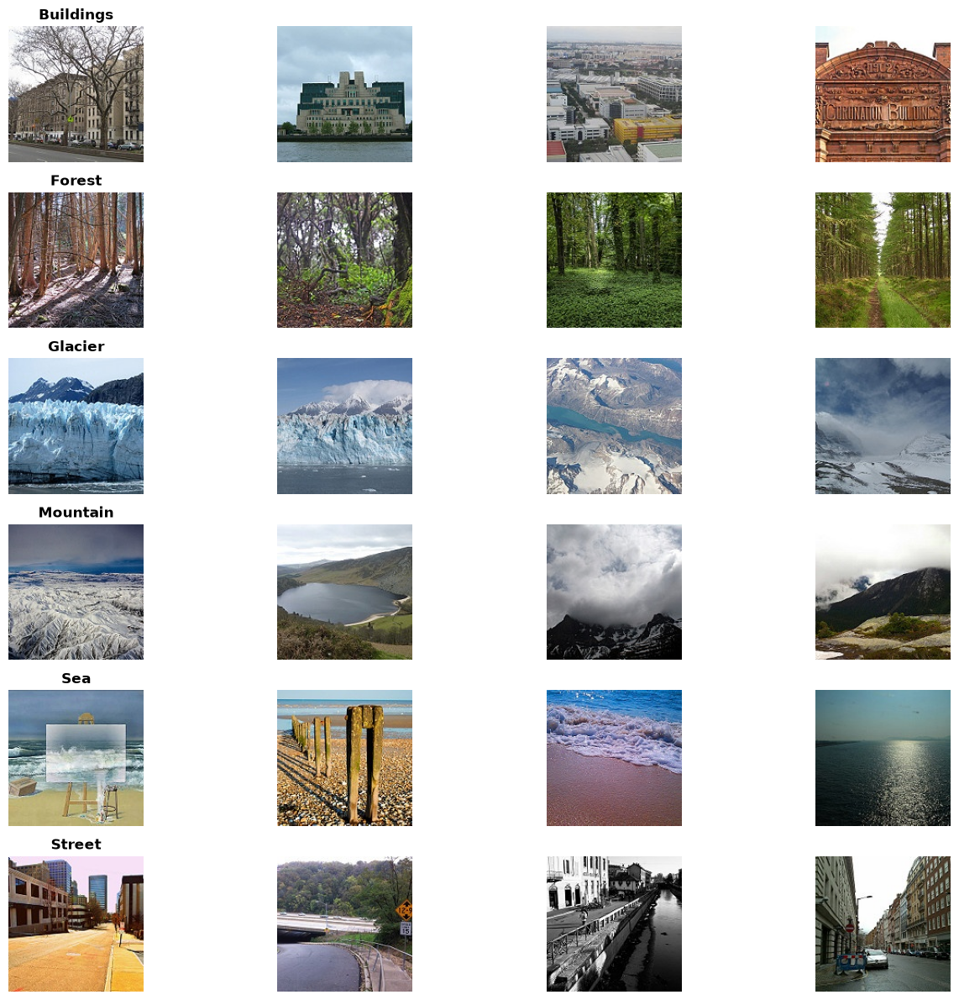

In [ ]:
plt.figure(figsize=(14,12))

for i , class_name in enumerate(classes):
    class_path=os.path.join(train_path,class_name)
    image_names=random.sample(os.listdir(class_path),4)

    for j ,image_name in enumerate(image_names):
        image_path=os.path.join(class_path,image_name)
        image=Image.open(image_path)

        position = i*4 + j+1

        plt.subplot(6,4,position)
        plt.imshow(image)
        plt.axis('off')

        if j==0:
            plt.title(class_name.capitalize(),fontsize=12,fontweight="bold")

plt.tight_layout()
plt.show()




### 🔍 Visual Observations

The visual inspection suggests that:

**Easier-to-distinguish classes:**
- 🏢 Buildings
- 🌲 Forest
- 🌊 Sea
- 🚶 Street

These classes often contain distinctive structures, textures, or environmental patterns.

**Potentially difficult classes:**
- 🧊 Glacier
- 🏔️ Mountain

These classes share several visual characteristics, including snow, rocky terrain, similar colors, and mountain-like structures.

### 💡 Hypothesis

We hypothesize that **glacier and mountain scenes may have a higher classification error rate** because of their visual overlap.

This hypothesis will be tested later using model evaluation metrics and a confusion matrix.

In [ ]:
sample_image=Image.open(sample_path)

image_array=np.array(sample_image)

print("Shape:",image_array.shape)
print("Data Type:",image_array.dtype)
print("Minimum pixel value:",image_array.min())
print("Maximum pixel value:",image_array.max())



Shape: (150, 150, 3)
Data Type: uint8
Minimum pixel value: 0
Maximum pixel value: 255


In [4]:
import tensorflow as tf

print(tf.__version__)

2.21.0


In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [78]:
data_generator=ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

In [7]:
train_generator=data_generator.flow_from_directory(
    train_path,
    target_size=(150,150),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
    )

Found 11230 images belonging to 6 classes.


In [8]:
val_generator=data_generator.flow_from_directory(
    train_path,
    target_size=(150,150),
    batch_size=32,
    subset='validation',
    class_mode='categorical',
    shuffle=False,
    seed=42

)

Found 2804 images belonging to 6 classes.


In [20]:
train_generator.class_indices

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [21]:
image_batch,label_batch=next(train_generator)

print("Images shape:",image_batch.shape)
print("Labels shape:",label_batch.shape)
print("Pixel image:",image_batch.min(),"to",image_batch.max())


Images shape: (32, 150, 150, 3)
Labels shape: (32, 6)
Pixel image: 0.0 to 1.0


In [23]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import (
    Conv2D,
    MaxPool2D,
    GlobalAveragePooling2D,
    Dense,
    Dropout


)

model=Sequential([

    #Convolutional Block 1
    Conv2D(
        32,
        (3,3),
        activation='relu',
        input_shape=(150,150,3)
    ),
    MaxPool2D(pool_size=(2,2)),

    #Convolutional Block 2
    Conv2D(
        64,
        (3,3),
        activation='relu'
    ),
    MaxPool2D(pool_size=(2,2)),

    #Convolutional Block 3
    Conv2D(
        128,
        (3,3),
        activation='relu'
    ),
    MaxPool2D(pool_size=(2,2)),

    #Feature aggregation
    GlobalAveragePooling2D(),

    #Classification head
    Dense(64,activation='relu'),
    Dropout(0.5),

    #6 scene classes
    Dense(6,activation='softmax')
    ])

c:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [24]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [26]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 101,894 (398.02 KB)

 Trainable params: 101,894 (398.02 KB)

 Non-trainable params: 0 (0.00 B)

## 🚂 Baseline CNN Training

The baseline CNN is now compiled and ready for training.

The model will learn the visual features required to distinguish the six scene categories from the training images.

We will monitor both training and validation performance to identify:

- Whether the model is learning effectively
- Whether it is overfitting
- How well it generalizes to unseen validation images

In [28]:
history=model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=15

)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 126s 353ms/step - accuracy: 0.3983 - loss: 1.3806 - val_accuracy: 0.5360 - val_loss: 1.1110
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 238s 678ms/step - accuracy: 0.5243 - loss: 1.1126 - val_accuracy: 0.6255 - val_loss: 0.9616
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 257s 732ms/step - accuracy: 0.6015 - loss: 0.9729 - val_accuracy: 0.6630 - val_loss: 0.8609
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 284s 809ms/step - accuracy: 0.6386 - loss: 0.9061 - val_accuracy: 0.6951 - val_loss: 0.7811
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 191s 544ms/step - accuracy: 0.6640 - loss: 0.8549 - val_accuracy: 0.6976 - val_loss: 0.7802
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 112s 318ms/step - accuracy: 0.6835 - loss: 0.8014 - val_accuracy: 0.6876 - val_loss: 0.7979
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 115s 328ms/step - accuracy: 0.6974 - loss: 0.7738 - val_accuracy: 0.7261 - val_loss: 0.7205
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 146s 416ms/step - accuracy: 0.7164 -

In [31]:
model.save("../models/scene_classifier_cnn.keras")

In [ ]:
model = load_model("../models/scene_classifier_cnn.keras")

## 📈 Baseline CNN — Training Performance

We now evaluate how the baseline CNN performed during training.

Training and validation accuracy are compared to determine whether the model learned useful patterns and whether it shows signs of overfitting.

We also examine the training and validation loss curves.

In [11]:
print(model)

<Sequential name=sequential, built=True>


In [12]:
val_loss,val_accuracy=model.evaluate(val_generator)

print("Validation Loss:",val_loss)
print("Validation Accuracy:",val_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - accuracy: 0.7882 - loss: 0.5735
Validation Loss: 0.573492169380188
Validation Accuracy: 0.7881597876548767


In [13]:
val_generator.reset()

predictions=model.predict(val_generator)

y_pred=np.argmax(predictions,axis=1)
y_true=val_generator.classes

88/88 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step


In [ ]:
cm=confusion_matrix(y_true,y_pred)

print(cm)

[[344   1   5   4   3  81]
 [  0 404   0  12   0  38]
 [  4   1 345 113   6  11]
 [  4   1  47 433  12   5]
 [ 30   1  39  92 281  11]
 [ 65   0   1   5   2 403]]


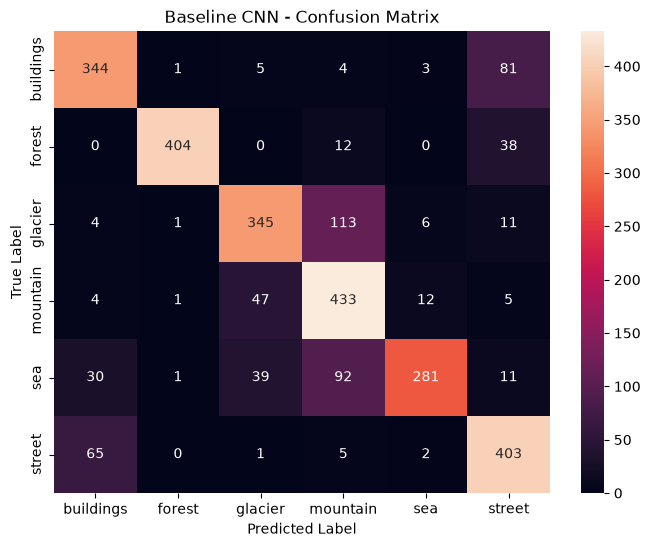

In [18]:
plt.figure(figsize=(8,6))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=classes,
    yticklabels=classes
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Baseline CNN - Confusion Matrix")

plt.show()

## 🔍 Confusion Matrix Observations

The confusion matrix provides a more detailed view of the baseline CNN's classification performance than overall accuracy alone.

### 📌 Key Observations

- **Forest** was the easiest class for the baseline model, with approximately **89% recall**.
- **Mountain** and **Street** also achieved relatively strong recall, at approximately **86%** and **85%**, respectively.
- **Sea** was the most difficult class, with approximately **62% recall**.
- **Glacier** was another challenging class, with approximately **72% recall**.

### 🔄 Major Classification Confusions

Several recurring confusion patterns were observed:

1. **Glacier → Mountain**
   - 113 glacier images were classified as mountains.
   - This supports our initial EDA hypothesis that glacier and mountain scenes share similar visual characteristics.

2. **Mountain → Glacier**
   - 47 mountain images were classified as glaciers.
   - This further demonstrates the visual overlap between the two categories.

3. **Sea → Mountain**
   - 92 sea images were classified as mountains.
   - This was an unexpected source of error and suggests that some sea scenes may contain mountainous landscapes or visual patterns that resemble mountain scenes.

4. **Buildings ↔ Street**
   - 81 building images were classified as street scenes.
   - 65 street images were classified as buildings.
   - This is reasonable because both categories frequently contain buildings and other urban structures.

### 💡 Overall Finding

The baseline CNN achieved approximately **79% validation accuracy**, but the confusion matrix reveals that performance is not uniform across all classes.

The model performs well on visually distinctive categories such as forest and street, while it struggles more with visually overlapping categories such as sea, glacier, and mountain.

These observations will guide the next stage of the project, where we will investigate the model's incorrect predictions and explore methods for improving its performance.

In [19]:
error_generator=data_generator.flow_from_directory(
    train_path,
    batch_size=32,
    target_size=(150,150),
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed =42
)

Found 2804 images belonging to 6 classes.


In [21]:
error_generator.reset()

predictions = model.predict(error_generator)

y_pred = np.argmax(predictions, axis=1)
y_true = error_generator.classes

88/88 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step


In [33]:
incorrect_indices = np.where(y_pred != y_true)[0]

print("Incorrect predictions:", len(incorrect_indices))

Incorrect predictions: 594


In [ ]:
np.random.seed(42)

random_indices = np.random.choice(
    incorrect_indices,
    size=12,
    replace=False
)



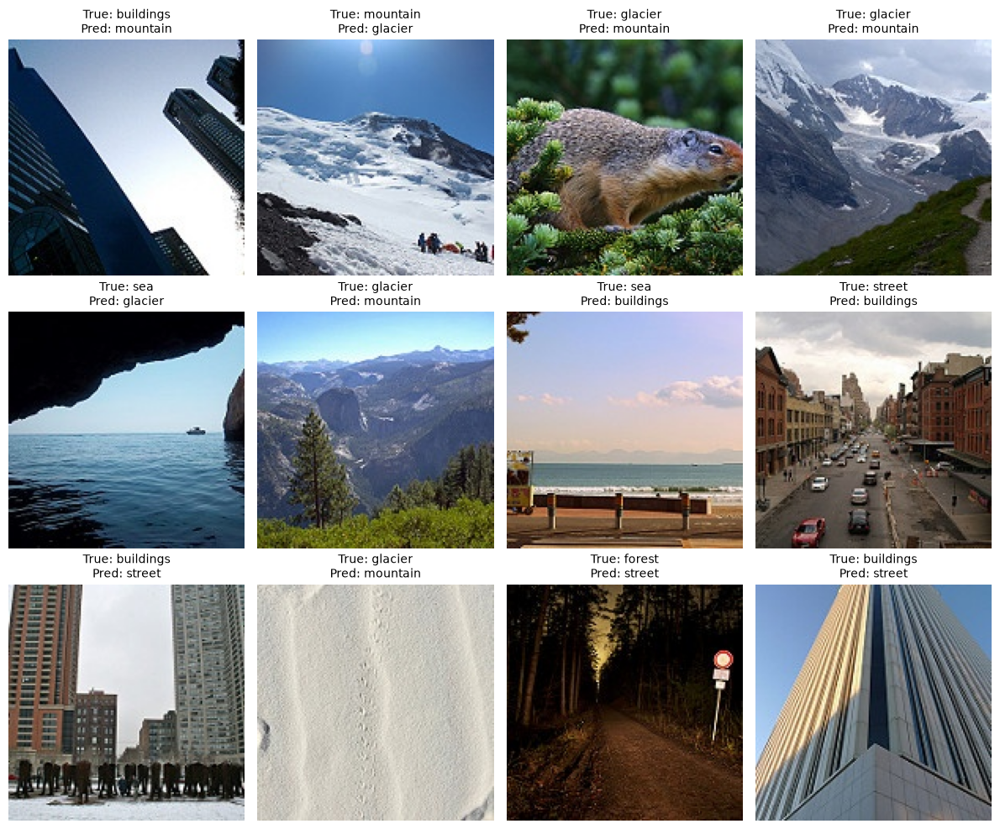

In [45]:
plt.figure(figsize=(12, 10))

for i, idx in enumerate(random_indices):

    image_path = error_generator.filepaths[idx]
    image = Image.open(image_path)

    true_class = classes[y_true[idx]]
    predicted_class = classes[y_pred[idx]]

    plt.subplot(3, 4, i + 1)
    plt.imshow(image)

    plt.title(
        f"True: {true_class}\nPred: {predicted_class}",
        fontsize=10
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

## 🔍 Misclassification Observations

Inspection of incorrect predictions showed that most errors occur between visually similar or overlapping scene categories.

- **Glacier and mountain** images are frequently confused because of shared snow, rock, and mountainous structures.
- **Sea** images are often confused with mountain or glacier scenes due to similar natural landscapes, colors, and textures.
- **Buildings and street** scenes overlap because urban images commonly contain both roads and buildings.
- Some errors appear genuinely ambiguous even to a human observer, showing the limitations of the baseline CNN.

These observations motivate the use of a stronger pretrained model through **transfer learning**.

In [79]:
tf_data_generator = ImageDataGenerator(
    validation_split=0.2
)

In [8]:
tf_train_generator = tf_data_generator.flow_from_directory(
    train_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode="categorical",
    subset="training",
    shuffle=True,
    seed=42
)

Found 11230 images belonging to 6 classes.


In [9]:
tf_val_generator = tf_data_generator.flow_from_directory(
    train_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode="categorical",
    subset="validation",
    shuffle=False,
    seed=42
)

Found 2804 images belonging to 6 classes.


In [69]:
images_tf, labels_tf = next(tf_val_generator)

print("Shape:", images_tf.shape)
print("Pixel range:", images_tf.min(), "to", images_tf.max())

Shape: (32, 150, 150, 3)
Pixel range: 0.0 to 255.0


In [10]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D,Dense,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model

In [11]:
base_model=EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(150,150,3)
)

In [70]:
base_model.trainable=False

In [ ]:
model_tl=Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128,activation='relu'),
    Dropout(0.5),
    Dense(6,activation='softmax')
])

In [72]:
model_tl.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [73]:
model_tl.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 5, 5, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,313 (16.08 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [75]:
history_tl=model_tl.fit(
    tf_train_generator,
    validation_data=tf_val_generator,
    epochs=10
)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 244s 661ms/step - accuracy: 0.8830 - loss: 0.3287 - val_accuracy: 0.9223 - val_loss: 0.2216
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 638s 2s/step - accuracy: 0.9228 - loss: 0.2190 - val_accuracy: 0.9237 - val_loss: 0.2033
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 378s 1s/step - accuracy: 0.9304 - loss: 0.1917 - val_accuracy: 0.9258 - val_loss: 0.2005
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 332s 947ms/step - accuracy: 0.9369 - loss: 0.1695 - val_accuracy: 0.9265 - val_loss: 0.2003
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 294s 839ms/step - accuracy: 0.9424 - loss: 0.1558 - val_accuracy: 0.9226 - val_loss: 0.2100
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 302s 862ms/step - accuracy: 0.9441 - loss: 0.1468 - val_accuracy: 0.9297 - val_loss: 0.1974
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 429s 1s/step - accuracy: 0.9476 - loss: 0.1378 - val_accuracy: 0.9301 - val_loss: 0.1971
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 361s 1s/step - accuracy: 0.9467 - loss: 0.136

In [55]:
model_tl.save("../models/scene_classifier_efficientnetb0.keras")

In [84]:
import os

print(os.path.exists("../models/scene_classifier_efficientnetb0.keras"))

True


In [56]:
tf_val_generator.reset()
tl_loss, tl_accuracy = model_tl.evaluate(tf_val_generator)

print("Loss:", tl_loss)
print("Accuracy:", tl_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.9312 - loss: 0.2062
Loss: 0.2062007188796997
Accuracy: 0.9311697483062744


In [57]:
tf_val_generator.reset()

predictions = model_tl.predict(tf_val_generator)

y_pred = np.argmax(predictions, axis=1)
y_true = tf_val_generator.classes

print("Predictions:", len(y_pred))
print("True labels:", len(y_true))

88/88 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step
Predictions: 2804
True labels: 2804


In [48]:
base_model = model_tl.layers[0]

print(type(base_model))
print("Total layers:", len(base_model.layers))

<class 'keras.src.models.functional.Functional'>
Total layers: 238


In [78]:
print("Model output shape:", model_tl.output_shape)

Model output shape: (None, 6)


In [58]:
manual_accuracy = np.mean(y_pred == y_true)

print("Manual Accuracy:", manual_accuracy)

Manual Accuracy: 0.931169757489301


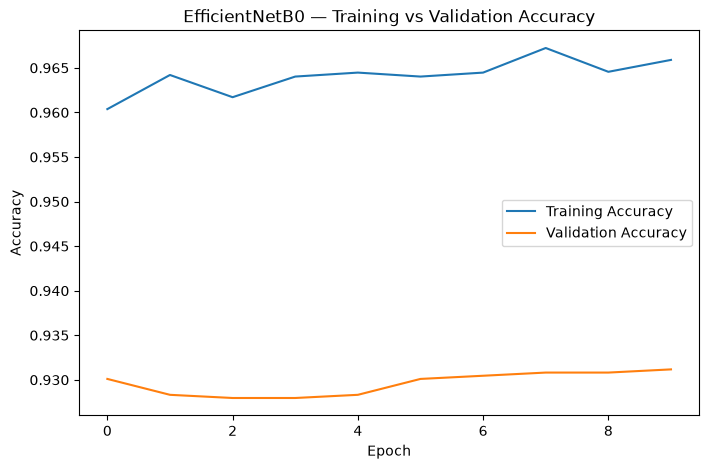

In [59]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_tl.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    history_tl.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("EfficientNetB0 — Training vs Validation Accuracy")
plt.legend()
plt.show()

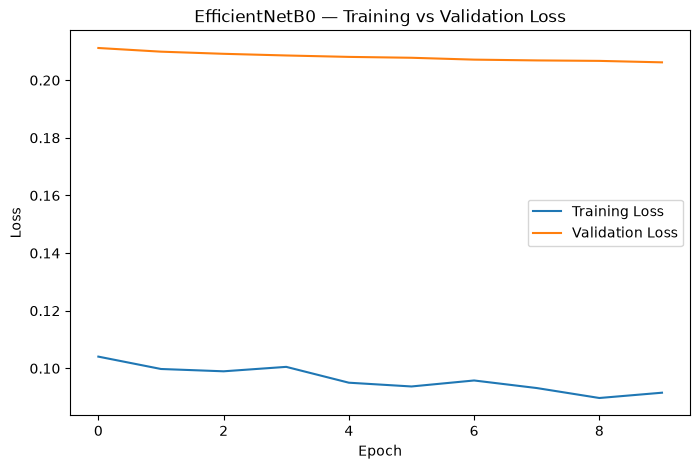

In [60]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_tl.history["loss"],
    label="Training Loss"
)

plt.plot(
    history_tl.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("EfficientNetB0 — Training vs Validation Loss")
plt.legend()
plt.show()

In [46]:
model_tl = load_model("../models/scene_classifier_efficientnetb0.keras")

In [61]:
cm_tl=confusion_matrix(y_true,y_pred)

print(cm_tl)

[[403   0   0   0   0  35]
 [  0 448   2   1   1   2]
 [  3   0 411  53  11   2]
 [  2   0  39 454   7   0]
 [  2   0  11   3 437   1]
 [ 16   0   1   1   0 458]]


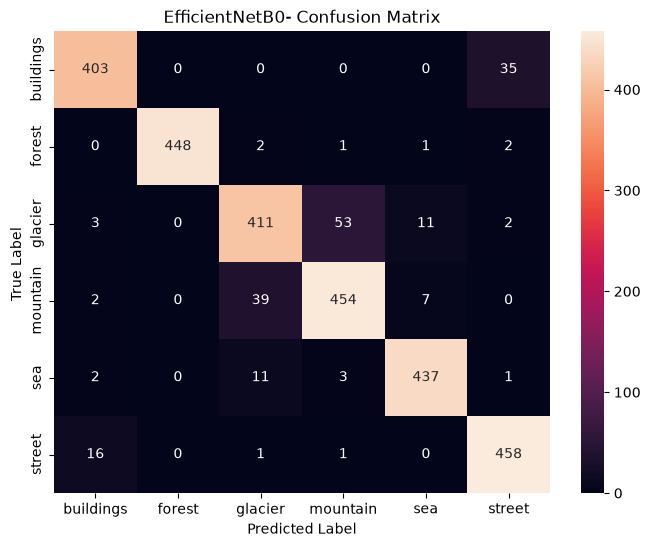

In [62]:
plt.figure(figsize=(8,6))

sns.heatmap(
    cm_tl,
    annot=True,
    fmt="d",
    xticklabels=classes,
    yticklabels=classes
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label ")
plt.title("EfficientNetB0- Confusion Matrix")

plt.show()

In [63]:
print(
    classification_report(
    y_true,
    y_pred,
    target_names=classes
)
)

              precision    recall  f1-score   support

   buildings       0.95      0.92      0.93       438
      forest       1.00      0.99      0.99       454
     glacier       0.89      0.86      0.87       480
    mountain       0.89      0.90      0.90       502
         sea       0.96      0.96      0.96       454
      street       0.92      0.96      0.94       476

    accuracy                           0.93      2804
   macro avg       0.93      0.93      0.93      2804
weighted avg       0.93      0.93      0.93      2804



In [64]:
incorrect_indices = np.where(y_pred != y_true)[0]

print("Incorrect predictions:", len(incorrect_indices))

Incorrect predictions: 193


In [65]:
np.random.seed(42)

random_indices = np.random.choice(
    incorrect_indices,
    size=12,
    replace=False
)

print(random_indices)

[ 914 1687 1167 1774 1403 1838  186  210  194  105 1180 1395]


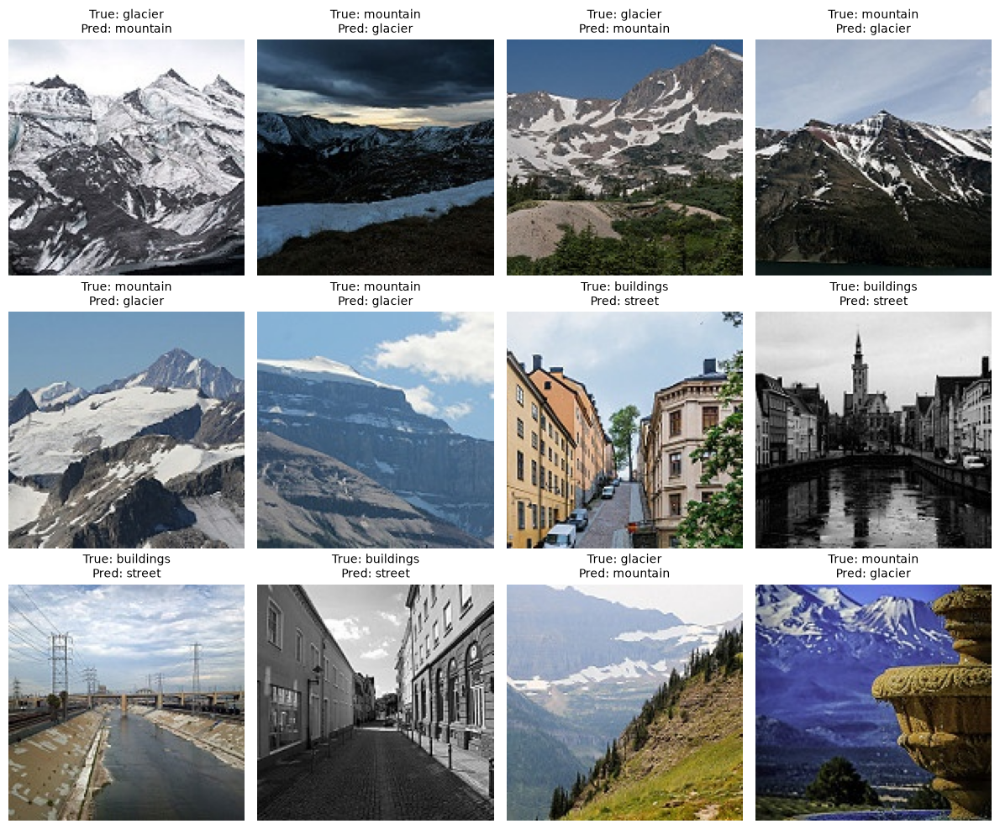

In [66]:
plt.figure(figsize=(12, 10))

for i, idx in enumerate(random_indices):

    image_path = tf_val_generator.filepaths[idx]
    image = Image.open(image_path)

    true_class = classes[y_true[idx]]
    predicted_class = classes[y_pred[idx]]

    plt.subplot(3, 4, i + 1)
    plt.imshow(image)

    plt.title(
        f"True: {true_class}\nPred: {predicted_class}",
        fontsize=10
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

## 🔍 EfficientNetB0 Evaluation Observations

EfficientNetB0 achieved approximately **93% validation accuracy**, substantially outperforming the baseline CNN (~79%).

- Performance improved across all six scene classes.
- **Forest** achieved the highest recall at approximately 98.5%.
- **Sea** improved dramatically from ~62% to ~96.5% recall.
- **Buildings** and **Street** also showed strong improvement.
- **Glacier and Mountain** remain the most significant source of confusion, reflecting their visual similarity.
- The macro and weighted F1-scores are both approximately **0.93**, indicating balanced overall performance.

Overall, transfer learning provided a substantial improvement over the CNN trained from scratch.

In [12]:
model_tl2 = load_model("../models/scene_classifier_efficientnetb0.keras")

In [13]:
tf_val_generator.reset()

loss, acc = model_tl2.evaluate(tf_val_generator)

print("Starting accuracy:", acc)

88/88 ━━━━━━━━━━━━━━━━━━━━ 67s 676ms/step - accuracy: 0.9312 - loss: 0.2062
Starting accuracy: 0.9311697483062744


In [14]:
base_model_t2 = model_tl2.layers[0]

base_model_t2.trainable = True

for layer in base_model_t2.layers[:-20]:
    layer.trainable = False

for layer in base_model_t2.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

In [15]:
model_tl2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 5, 5, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,543,799 (17.33 MB)

 Trainable params: 1,507,510 (5.75 MB)

 Non-trainable params: 2,706,803 (10.33 MB)

 Optimizer params: 329,486 (1.26 MB)

In [16]:
from tensorflow.keras.optimizers import Adam
model_tl2.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [17]:
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

early_stop=EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True
)

checkpoint=ModelCheckpoint(
    "../models/scene_classifier_efficientnetb0_finetuned.keras",
    monitor="val_loss",
    save_best_only=True
)

In [18]:
history_ft=model_tl2.fit(
    tf_train_generator,
    validation_data=tf_val_generator,
    epochs=10,
    callbacks=[early_stop,checkpoint]

)

Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 229s 601ms/step - accuracy: 0.9668 - loss: 0.0914 - val_accuracy: 0.9333 - val_loss: 0.2051
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 190s 541ms/step - accuracy: 0.9695 - loss: 0.0866 - val_accuracy: 0.9337 - val_loss: 0.2060
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 188s 535ms/step - accuracy: 0.9680 - loss: 0.0864 - val_accuracy: 0.9326 - val_loss: 0.2057
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 208s 593ms/step - accuracy: 0.9695 - loss: 0.0809 - val_accuracy: 0.9337 - val_loss: 0.2030
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 190s 542ms/step - accuracy: 0.9734 - loss: 0.0775 - val_accuracy: 0.9326 - val_loss: 0.2072
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 250s 713ms/step - accuracy: 0.9729 - loss: 0.0714 - val_accuracy: 0.9319 - val_loss: 0.2116
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 268s 763ms/step - accuracy: 0.9706 - loss: 0.0739 - val_accuracy: 0.9322 - val_loss: 0.2073


In [21]:
best_val_acc=max(history_ft.history['val_accuracy'])
best_epoch=np.argmax(history_ft.history['val_accuracy'])+1

print("Baest Validation Accuracy:",best_val_acc)
print("Best Epoch:",best_epoch)



Baest Validation Accuracy: 0.9336661696434021
Best Epoch: 2


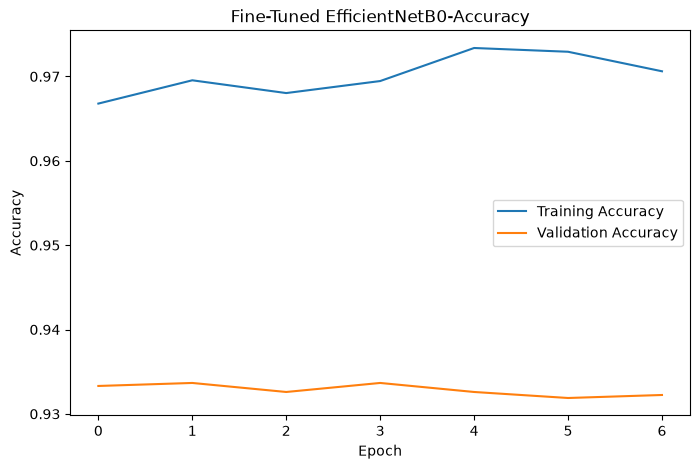

In [22]:
plt.figure(figsize=(8,5))


plt.plot(history_ft.history['accuracy'],label="Training Accuracy")
plt.plot(history_ft.history["val_accuracy"],label="Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Fine-Tuned EfficientNetB0-Accuracy")
plt.legend()
plt.show()

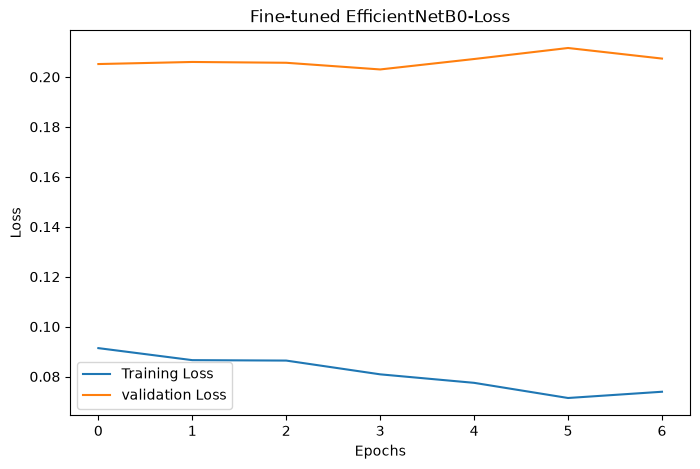

In [23]:
plt.figure(figsize=(8,5))

plt.plot(history_ft.history["loss"],label="Training Loss")
plt.plot(history_ft.history["val_loss"],label="validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Fine-tuned EfficientNetB0-Loss")
plt.legend()
plt.show()

In [24]:

tf_val_generator.reset()

ft_loss, ft_accuracy = model_tl2.evaluate(tf_val_generator)

print("Fine-Tuned Loss:", ft_loss)
print("Fine-Tuned Accuracy:", ft_accuracy)

88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 529ms/step - accuracy: 0.9337 - loss: 0.2030
Fine-Tuned Loss: 0.202985018491745
Fine-Tuned Accuracy: 0.9336661696434021


In [25]:
tf_val_generator.reset()

predictions_ft=model_tl2.predict(tf_val_generator)

88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 508ms/step


In [26]:
predictions_ft[0]

array([9.58688974e-01, 2.61856214e-04, 1.10683155e-04, 3.12057418e-05,
       4.05058861e-02, 4.01462137e-04], dtype=float32)

In [31]:
y_pred_ft=np.argmax(predictions_ft,axis=1)
y_true_ft=tf_val_generator.classes

print("Predictions:", len(y_pred_ft))
print("True labels:", len(y_true_ft))

Predictions: 2804
True labels: 2804


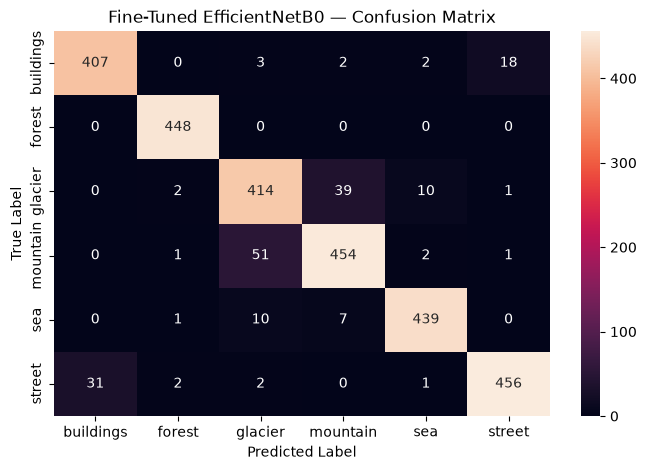

In [34]:
cm_ft=confusion_matrix(y_pred_ft,y_true_ft)

plt.figure(figsize=(8,5))

sns.heatmap(
    cm_ft,
    annot=True,
    fmt="d",
    xticklabels=classes,
    yticklabels=classes

)

plt.xlabel('Predicted Label')
plt.ylabel("True Label")
plt.title("Fine-Tuned EfficientNetB0 — Confusion Matrix")

plt.show()

In [33]:
print(
    classification_report(
        y_pred_ft,
        y_true_ft,
        target_names=classes
    )
)

              precision    recall  f1-score   support

   buildings       0.93      0.94      0.94       432
      forest       0.99      1.00      0.99       448
     glacier       0.86      0.89      0.88       466
    mountain       0.90      0.89      0.90       509
         sea       0.97      0.96      0.96       457
      street       0.96      0.93      0.94       492

    accuracy                           0.93      2804
   macro avg       0.93      0.93      0.93      2804
weighted avg       0.93      0.93      0.93      2804



## 🔬 Fine-Tuning Results

Fine-tuning the final layers of EfficientNetB0 produced a validation accuracy of approximately **93.37%**, compared with approximately **93.05%** for the frozen EfficientNetB0.

The improvement was relatively small, indicating that the pretrained EfficientNetB0 features were already highly effective for this task.

Fine-tuning reduced the major **Glacier → Mountain** confusion from 69 to 39 samples, although **Mountain → Glacier** confusion increased from 27 to 51 samples.

The final model achieved a macro F1-score of approximately **0.93**, with particularly strong performance on Forest and Sea scenes.

Overall, the fine-tuned EfficientNetB0 was selected as the final scene-classification model.

In [35]:
model_tl2.save("../models/scene_classifier_efficientnetb0_finetuned.keras")

In [36]:
import os

path = "../models/scene_classifier_efficientnetb0_finetuned.keras"

print("Saved:", os.path.exists(path))

Saved: True


In [38]:
from tensorflow.keras.utils import load_img,img_to_array

In [54]:
class_names = [
    "buildings",
    "forest",
    "glacier",
    "mountain",
    "sea",
    "street"
]

def predict_scene(image_path):

    image = load_img(
        image_path,
        target_size=(150, 150)
    )

    image = img_to_array(image)

    
    image = np.expand_dims(image, axis=0)

    probabilities = model_tl2.predict(
        image,
        verbose=0
    )[0]

    predicted_index = np.argmax(probabilities)

    predicted_class = class_names[predicted_index]
    confidence = probabilities[predicted_index]

    print("Predicted class:", predicted_class)
    print("Confidence:", f"{confidence:.2%}")

    return predicted_class, confidence


In [65]:
#actual label:sea
predict_scene(r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_test\sea\20076.jpg")

Predicted class: sea
Confidence: 100.00%


('sea', np.float32(0.99995184))

In [66]:
#actual label:building
predict_scene(r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_test\buildings\20064.jpg")

Predicted class: buildings
Confidence: 100.00%


('buildings', np.float32(0.9999999))

In [67]:
#actual label: glacier
predict_scene(r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_test\glacier\20087.jpg")

Predicted class: glacier
Confidence: 100.00%


('glacier', np.float32(0.99999356))

In [68]:
#actual label:mountain
predict_scene(r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_test\mountain\20327.jpg")

Predicted class: mountain
Confidence: 99.99%


('mountain', np.float32(0.9999454))

In [71]:
import os
import random

test_path=(r"C:\Users\DELL\OneDrive\Documents\ML-Projects\visual_intelligence_system\data\raw\scene_classification\seg_test")

test_files=[]

for class_name in class_names:
    class_path=os.path.join(test_path,class_name)

    files=[
        os.path.join(class_path,f)
        for f in os.listdir(class_path)
        if f.lower().endswith((".jpg",".jpeg",".png"))
        ]
    selected=random.sample(files,min(2,len(files)))
    test_files.extend(selected)

print("Images selected:",len(test_files))
    
    



Images selected: 12


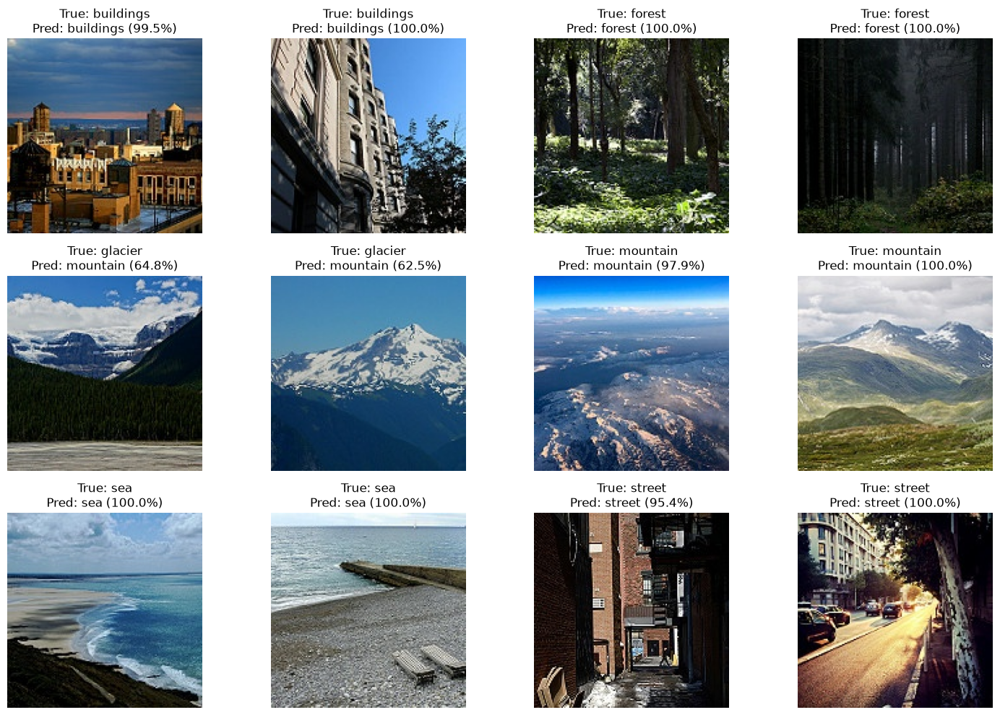

In [72]:
plt.figure(figsize=(15, 10))

for i, path in enumerate(test_files):

    img = load_img(path, target_size=(150, 150))
    img_array = img_to_array(img)

    input_image = np.expand_dims(img_array, axis=0)

    probabilities = model_tl2.predict(
        input_image,
        verbose=0
    )[0]

    pred_index = np.argmax(probabilities)
    pred_class = class_names[pred_index]
    confidence = probabilities[pred_index]

    actual_class = os.path.basename(os.path.dirname(path))

    plt.subplot(3, 4, i + 1)
    plt.imshow(img_array.astype("uint8"))
    plt.axis("off")

    plt.title(
        f"True: {actual_class}\n"
        f"Pred: {pred_class} ({confidence:.1%})"
    )

plt.tight_layout()
plt.show()

## 🧪 Qualitative Evaluation on Held-Out Test Images

The fine-tuned EfficientNetB0 was tested on 12 images from the separate `seg_test` dataset.

- 10 out of 12 images were classified correctly.
- Buildings, Forest, Mountain, Sea, and Street images were correctly classified in this sample.
- Both incorrect predictions were **Glacier → Mountain**.
- The glacier predictions had moderate confidence (~63–65%), indicating uncertainty.
- This agrees with the confusion matrix, where Glacier and Mountain were the main source of classification errors.

Overall, the qualitative results are consistent with the quantitative evaluation and show strong performance on most scene classes, with Glacier vs Mountain remaining the primary challenge.

In [80]:
test_generator = tf_data_generator.flow_from_directory(
    test_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

print("Test samples:", test_generator.samples)
print("Classes:", test_generator.class_indices)

Found 3000 images belonging to 6 classes.
Test samples: 3000
Classes: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


In [81]:
test_generator.reset()

test_loss, test_accuracy = model_tl2.evaluate(test_generator)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

94/94 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.9270 - loss: 0.2450
Test Loss: 0.24502834677696228
Test Accuracy: 0.9269999861717224


In [82]:
test_generator.reset()

predictions = model_tl2.predict(test_generator, verbose=1)

y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

print("Predictions:", len(y_pred))
print("True labels:", len(y_true))

94/94 ━━━━━━━━━━━━━━━━━━━━ 126s 1s/step
Predictions: 3000
True labels: 3000


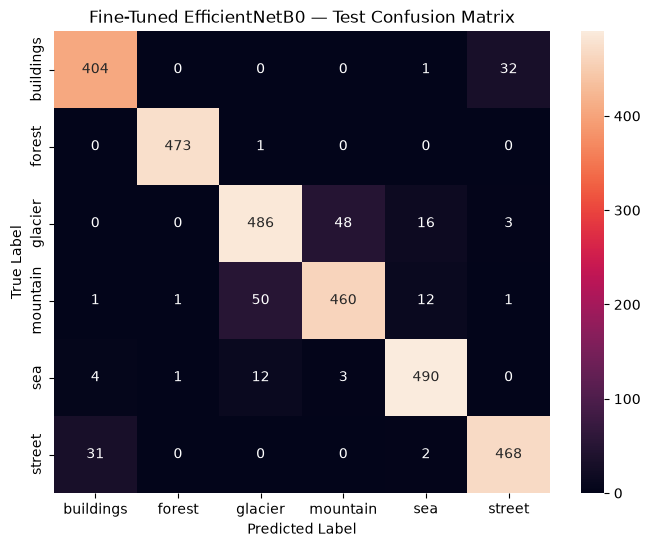

In [83]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned EfficientNetB0 — Test Confusion Matrix")

plt.show()

## 🏆 Final Scene Classification Results

The fine-tuned EfficientNetB0 achieved a validation accuracy of **93.37%** and a final test accuracy of **92.70%**.

The small difference between validation and test performance (~0.67 percentage points) indicates good generalization to unseen images.

The model performed particularly well on **Forest** and **Sea** scenes. The main classification challenges were **Glacier vs Mountain** and, to a lesser extent, **Buildings vs Street**, which showed noticeable confusion in the test confusion matrix.

Overall, EfficientNetB0 provided a substantial improvement over the baseline CNN and was selected as the final scene-classification model.

# PASCAL VOC 2012 — Object Detection

## Project Overview

This project uses the PASCAL VOC 2012 dataset to build an object
detection model capable of detecting 20 different object classes.

The dataset was initially explored and analyzed locally using VS Code.
The exploratory data analysis (EDA) includes examining the dataset
structure, class distribution, image information, and annotations.

Since the local system did not have a suitable GPU for training,
the preprocessing, YOLO dataset preparation, model training, validation,
testing, and error analysis were performed using Kaggle's GPU environment.

The final trained YOLO model was saved and downloaded for use in the
final combined computer vision system.

## Workflow

The overall workflow for the object detection component was:

1. Exploratory Data Analysis (EDA)
2. Dataset preprocessing
3. Conversion of PASCAL VOC annotations to YOLO format
4. YOLO model training
5. Model evaluation
6. Visual prediction analysis
7. Error analysis
8. Final model selection and saving

The EDA was performed locally, while the computationally intensive
preprocessing and model training were performed on Kaggle using a GPU.

In [2]:
voc_path=r"D:\MLData\VOC2012_train_val\VOC2012_train_val"

In [3]:
import os

print(os.listdir(voc_path))

['Annotations', 'devkit_doc.pdf', 'ImageSets', 'JPEGImages', 'SegmentationClass', 'SegmentationObject']


In [5]:
annotation_path=os.path.join(
    voc_path,
    "Annotations"
)

xml_files=os.listdir(annotation_path)

print("Number of annoatations:",len(xml_files))
print("Example:",xml_files[:5])

Number of annoatations: 17125
Example: ['2007_000027.xml', '2007_000032.xml', '2007_000033.xml', '2007_000039.xml', '2007_000042.xml']


In [6]:
xml_file=os.path.join(annotation_path,xml_files[0])

with open(xml_file,"r") as f:
    print(f.read())

<annotation>
	<folder>VOC2012</folder>
	<filename>2007_000027.jpg</filename>
	<source>
		<database>The VOC2007 Database</database>
		<annotation>PASCAL VOC2007</annotation>
		<image>flickr</image>
	</source>
	<size>
		<width>486</width>
		<height>500</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>person</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>174</xmin>
			<ymin>101</ymin>
			<xmax>349</xmax>
			<ymax>351</ymax>
		</bndbox>
		<part>
			<name>head</name>
			<bndbox>
				<xmin>169</xmin>
				<ymin>104</ymin>
				<xmax>209</xmax>
				<ymax>146</ymax>
			</bndbox>
		</part>
		<part>
			<name>hand</name>
			<bndbox>
				<xmin>278</xmin>
				<ymin>210</ymin>
				<xmax>297</xmax>
				<ymax>233</ymax>
			</bndbox>
		</part>
		<part>
			<name>foot</name>
			<bndbox>
				<xmin>273</xmin>
				<ymin>333</ymin>
				<xmax>297</xmax>
				<ymax>354</ymax>
			</bndbox>
		</part>
		<part>
			<name>foot<

In [7]:
import xml.etree.ElementTree as ET

xml_file = os.path.join(annotation_path, xml_files[0])

tree = ET.parse(xml_file)
root = tree.getroot()

print("Image:", root.find("filename").text)

for obj in root.findall("object"):
    name = obj.find("name").text
    bbox = obj.find("bndbox")

    xmin = int(bbox.find("xmin").text)
    ymin = int(bbox.find("ymin").text)
    xmax = int(bbox.find("xmax").text)
    ymax = int(bbox.find("ymax").text)

    print(
        f"Object: {name} | "
        f"Box: ({xmin}, {ymin}, {xmax}, {ymax})"
    )

Image: 2007_000027.jpg
Object: person | Box: (174, 101, 349, 351)


In [8]:
import matplotlib.patches as patches


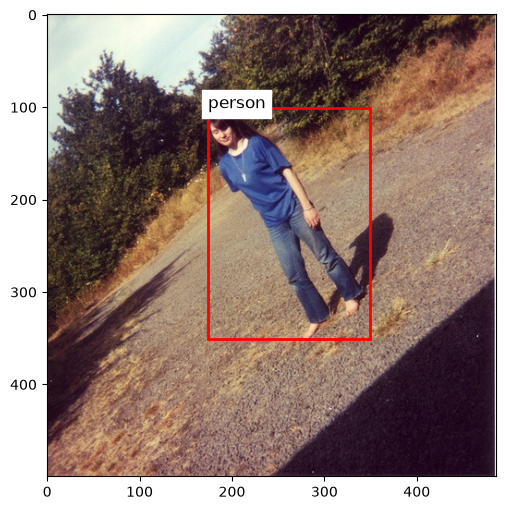

In [9]:
image_path=os.path.join(
    voc_path,"JPEGImages",
    "2007_000027.jpg"
)

image=Image.open(image_path)

fig,ax=plt.subplots(figsize=(8,6))

ax.imshow(image)

rect=patches.Rectangle(
    (174,101),
    349-174,
    351-101,
    linewidth=2,
    edgecolor='red',
    facecolor='none'
)

ax.add_patch(rect)

ax.text(
    174,
    101,
    "person",
    fontsize=12,
    backgroundcolor="white"
)

# ax.axis("off")
plt.show()


In [10]:
print("Images:", len(os.listdir(os.path.join(voc_path, "JPEGImages"))))
print("Annotations:", len(os.listdir(os.path.join(voc_path, "Annotations"))))

Images: 17125
Annotations: 17125


In [11]:
from collections import Counter

class_counts = Counter()

for xml_file in xml_files:
    xml_path = os.path.join(annotation_path, xml_file)

    tree = ET.parse(xml_path)
    root = tree.getroot()

    for obj in root.findall("object"):
        class_name = obj.find("name").text
        class_counts[class_name] += 1

print("Number of classes:", len(class_counts))
print("\nObject counts:")
for cls, count in class_counts.most_common():
    print(f"{cls}: {count}")

Number of classes: 20

Object counts:
person: 17401
chair: 3056
car: 2492
dog: 1598
bottle: 1561
cat: 1277
bird: 1271
pottedplant: 1202
sheep: 1084
boat: 1059
aeroplane: 1002
tvmonitor: 893
sofa: 841
bicycle: 837
horse: 803
motorbike: 801
diningtable: 800
cow: 771
train: 704
bus: 685


C:\Users\DELL\AppData\Local\Temp\ipykernel_21440\3526665666.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


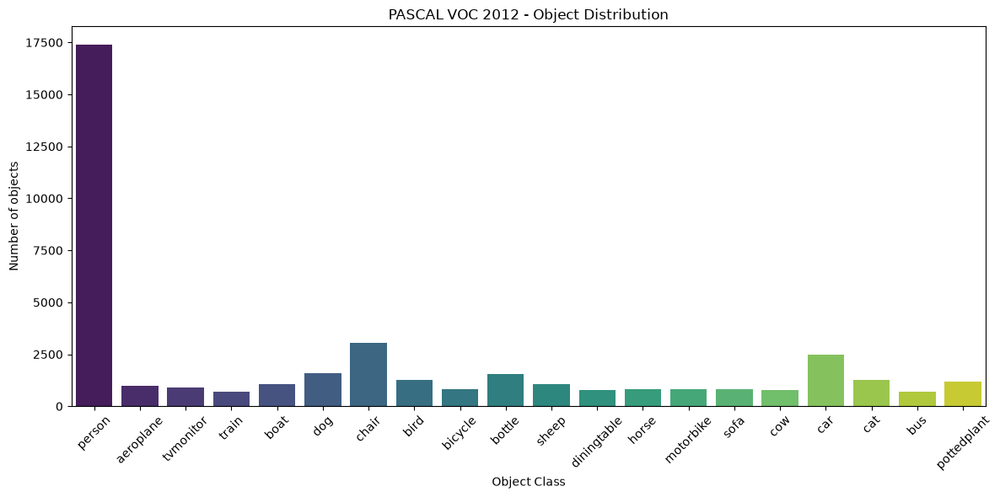

In [12]:
plt.figure(figsize=(12,6))

sns.barplot(
    x=list(class_counts.keys()),
    y=list(class_counts.values()),
    palette="viridis"
    )

plt.xticks(rotation=45)
plt.xlabel("Object Class")
plt.ylabel("Number of objects")
plt.title("PASCAL VOC 2012 - Object Distribution")

plt.tight_layout()
plt.show()

## Object Class Distribution

The VOC 2012 dataset contains 20 object classes with a noticeably imbalanced distribution.

- `person` is the most frequent class by a large margin.
- `chair` and `car` are also relatively common.
- Several classes such as `train`, `bicycle`, `horse`, `sofa`, and `cow` have fewer examples.
- This imbalance should be considered during model training and evaluation, as rare classes may be more difficult for the detector to learn.

In [13]:
train_file = os.path.join(
    voc_path,
    "ImageSets",
    "Main",
    "train.txt"
)

val_file = os.path.join(
    voc_path,
    "ImageSets",
    "Main",
    "val.txt"
)

with open(train_file, "r") as f:
    train_ids = [line.strip() for line in f]

with open(val_file, "r") as f:
    val_ids = [line.strip() for line in f]

print("Training images:", len(train_ids))
print("Validation images:", len(val_ids))
print("Total:", len(train_ids) + len(val_ids))

Training images: 5717
Validation images: 5823
Total: 11540


## Dataset Split

The VOC dataset provides predefined training and validation splits through `ImageSets/Main`.

- Training set: **5,717 images**
- Validation set: **5,823 images**
- Total used: **11,540 images**

The predefined splits will be used instead of creating a random train-validation split, ensuring a reproducible evaluation setup.

In [38]:
classes = sorted(class_counts.keys())

class_to_id = {
    name: idx
    for idx, name in enumerate(classes)
}

print(class_to_id)
print(classes)

{'aeroplane': 0, 'bicycle': 1, 'bird': 2, 'boat': 3, 'bottle': 4, 'bus': 5, 'car': 6, 'cat': 7, 'chair': 8, 'cow': 9, 'diningtable': 10, 'dog': 11, 'horse': 12, 'motorbike': 13, 'person': 14, 'pottedplant': 15, 'sheep': 16, 'sofa': 17, 'train': 18, 'tvmonitor': 19}
['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
